In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec

In [2]:
import plotly.offline as py
py.init_notebook_mode(connected=False)

<h1>Dataset<h1>

In [4]:
import pandas as pd 
df_train = pd.read_csv('/Users/shivangeeacharya/Downloads/Data_Science_Project/creditcard_train.csv')
df_test = pd.read_csv('/Users/shivangeeacharya/Downloads/Data_Science_Project/creditcard_test.csv')
df = df_train 
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,33419.0,-2.178201,-3.132187,1.315758,-0.129783,-2.736013,0.743459,-0.752718,-2.650826,-0.184284,...,-0.828762,-0.219136,-1.004913,0.788588,1.061994,-0.319407,-0.132313,0.333476,937.75,0
1,151317.0,2.064423,0.185575,-1.684612,0.411066,0.479555,-0.797963,0.205544,-0.240568,0.415454,...,-0.351331,-0.876025,0.343288,0.522189,-0.259568,0.173623,-0.056280,-0.029665,1.98,0
2,132434.0,-0.547505,0.798072,-0.719939,-1.129561,0.925708,0.763338,0.231338,0.799204,-0.277812,...,0.366664,1.068933,-0.101523,-1.604148,-0.318277,0.838076,0.012324,-0.015564,11.95,0
3,81787.0,-0.945710,0.323579,0.595681,-1.288095,0.818906,-0.748491,0.890076,-0.130671,-0.471365,...,-0.371528,-1.149510,0.217859,-0.507989,-0.026857,0.591496,-0.326179,-0.007543,24.98,0
4,125062.0,1.898722,-0.321038,-1.771837,0.672408,0.115019,-1.267347,0.612810,-0.441070,0.450298,...,0.015111,0.006269,-0.029094,-0.071333,0.179444,0.378225,-0.106042,-0.059506,104.36,0


## The entire dataframe

<h3>Print and describe the basic statistics of the dataset<h2>

In [31]:
print(df.shape)
print(df.describe())

(199364, 31)
                Time             V1             V2             V3  \
count  199364.000000  199364.000000  199364.000000  199364.000000   
mean    94806.201064       0.004189       0.000392      -0.002316   
std     47511.693849       1.954728       1.638375       1.519695   
min         0.000000     -56.407510     -72.715728     -48.325589   
25%     54206.250000      -0.918115      -0.599185      -0.891976   
50%     84650.000000       0.023565       0.064251       0.176980   
75%    139350.250000       1.317063       0.801119       1.025002   
max    172792.000000       2.454930      22.057729       9.382558   

                  V4             V5             V6             V7  \
count  199364.000000  199364.000000  199364.000000  199364.000000   
mean        0.000110      -0.003293       0.003792      -0.000129   
std         1.416631       1.388592       1.336094       1.251271   
min        -5.683171    -113.743307     -26.160506     -43.557242   
25%        -0.847490

In [8]:
print(df_test.shape)
df_test.info()

(85443, 31)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85443 entries, 0 to 85442
Data columns (total 31 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    85443 non-null  float64
 1   V1      85443 non-null  float64
 2   V2      85443 non-null  float64
 3   V3      85443 non-null  float64
 4   V4      85443 non-null  float64
 5   V5      85443 non-null  float64
 6   V6      85443 non-null  float64
 7   V7      85443 non-null  float64
 8   V8      85443 non-null  float64
 9   V9      85443 non-null  float64
 10  V10     85443 non-null  float64
 11  V11     85443 non-null  float64
 12  V12     85443 non-null  float64
 13  V13     85443 non-null  float64
 14  V14     85443 non-null  float64
 15  V15     85443 non-null  float64
 16  V16     85443 non-null  float64
 17  V17     85443 non-null  float64
 18  V18     85443 non-null  float64
 19  V19     85443 non-null  float64
 20  V20     85443 non-null  float64
 21  V21     85443 non-null 

<h2>Analysis of Time and Amount<h2>

In case of fraudulent transactions, time and the amount of money are two extremely important parameters that we need to check. Moreover, as in this case these are the only two parameters that have been explicitly defined to us, we can take advantage of it and look more into it.

In [6]:
pd.set_option('precision', 3)
df.loc[:, ['Time', 'Amount']].describe()

,Time,Amount
count,199364.000,199364.000
mean,94806.201,88.762
std,47511.694,253.777
min,0.000,0.000
25%,54206.250,5.500
50%,84650.000,21.990
75%,139350.250,77.000
max,172792.000,25691.160


<h4>Time<h4>

According to dataset description, the dataset contains two days of transactions.

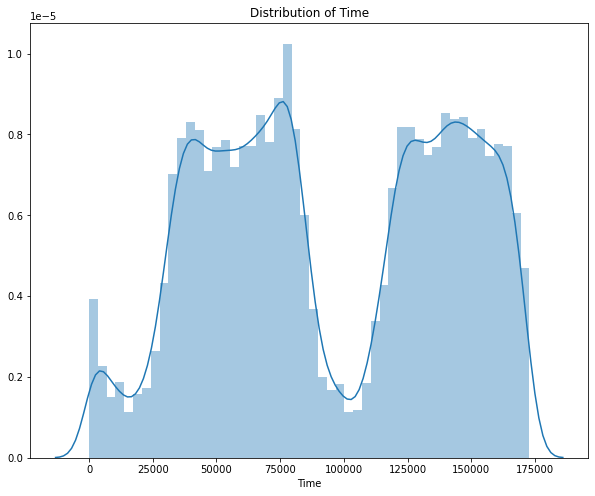

In [8]:
plt.figure(figsize=(10,8))
plt.title('Distribution of Time')
sns.distplot(df.Time)

In [23]:
df['Hour'] = df['Time'].map(lambda x : x // 3600 % 24)
df['Day'] = df['Time'].map(lambda x: x // 3600 // 24 + 1)
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V23,V24,V25,V26,V27,V28,Amount,Class,Hour,Day
0,33419.0,-2.178201,-3.132187,1.315758,-0.129783,-2.736013,0.743459,-0.752718,-2.650826,-0.184284,...,-1.004913,0.788588,1.061994,-0.319407,-0.132313,0.333476,937.75,0,9.0,1.0
1,151317.0,2.064423,0.185575,-1.684612,0.411066,0.479555,-0.797963,0.205544,-0.240568,0.415454,...,0.343288,0.522189,-0.259568,0.173623,-0.056280,-0.029665,1.98,0,18.0,2.0
2,132434.0,-0.547505,0.798072,-0.719939,-1.129561,0.925708,0.763338,0.231338,0.799204,-0.277812,...,-0.101523,-1.604148,-0.318277,0.838076,0.012324,-0.015564,11.95,0,12.0,2.0
3,81787.0,-0.945710,0.323579,0.595681,-1.288095,0.818906,-0.748491,0.890076,-0.130671,-0.471365,...,0.217859,-0.507989,-0.026857,0.591496,-0.326179,-0.007543,24.98,0,22.0,1.0
4,125062.0,1.898722,-0.321038,-1.771837,0.672408,0.115019,-1.267347,0.612810,-0.441070,0.450298,...,-0.029094,-0.071333,0.179444,0.378225,-0.106042,-0.059506,104.36,0,10.0,2.0


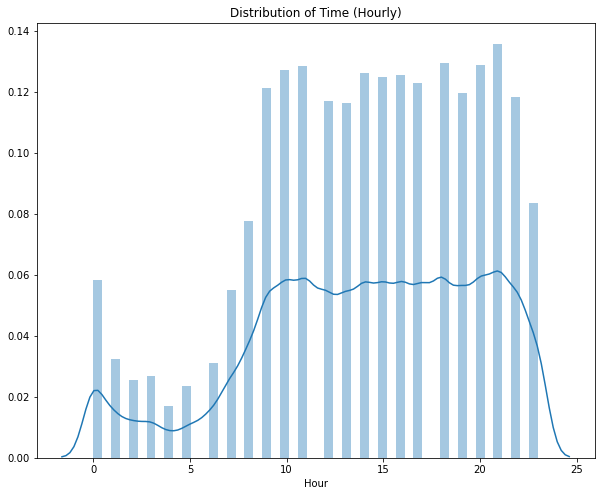

In [24]:
plt.figure(figsize=(10,8))
plt.title('Distribution of Time (Hourly)')
sns.distplot(df.Hour)

Hence, the credit card transactions are more frequent between 9 am to 23 pm, and less frequent from 1am to 7am.

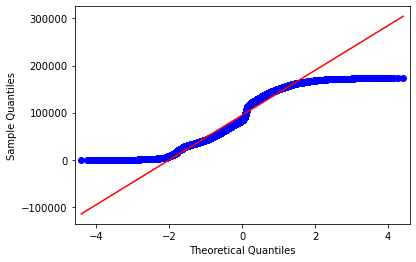

In [60]:
from statsmodels.graphics.gofplots import qqplot

qqplot_data = qqplot(df['Time'], line='s').gca().lines

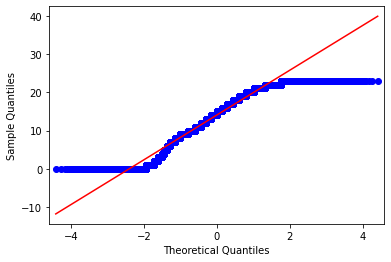

In [61]:
from statsmodels.graphics.gofplots import qqplot

qqplot_data = qqplot(df['Hour'], line='s').gca().lines

<h4>Amount<h4>

In [36]:
df.Amount.value_counts().head(10)

1.00     9563
1.98     4225
0.89     3387
9.99     3351
15.00    2269
10.00    2097
0.76     2085
1.29     2056
1.79     1825
0.99     1616
Name: Amount, dtype: int64

Thus, the top ten transaction amounts are less than equal to 15, and most of them are below 2.0

In [40]:
df.Amount.value_counts().tail(5)

302.96    1
436.86    1
339.58    1
844.06    1
810.30    1
Name: Amount, dtype: int64

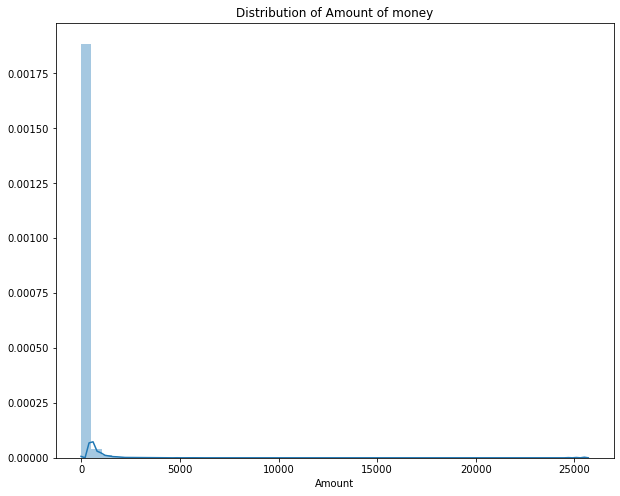

In [12]:
plt.figure(figsize=(10,8))
plt.title('Distribution of Amount of money')
sns.distplot(df.Amount)

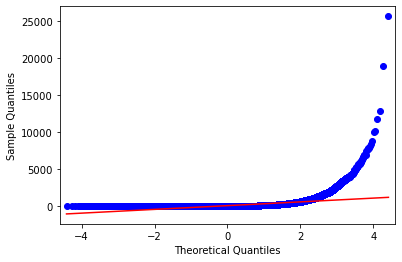

In [59]:
from statsmodels.graphics.gofplots import qqplot

qqplot_data = qqplot(df['Amount'], line='s').gca().lines

<h2>Scaling Amount and Time<h2>

In [9]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler2 = StandardScaler()

#scaling time
scaled_time = scaler.fit_transform(df[['Time']])
flat_list1 = [item for sublist in scaled_time.tolist() for item in sublist]
scaled_time = pd.Series(flat_list1)

#scaling the amount column
scaled_amount = scaler2.fit_transform(df[['Amount']])
flat_list2 = [item for sublist in scaled_amount.tolist() for item in sublist]
scaled_amount = pd.Series(flat_list2)

In [10]:
df1 = pd.DataFrame()
#concatenating newly created columns w original df
df1 = pd.concat([df, scaled_amount.rename('scaled_amount'), scaled_time.rename('scaled_time')], axis=1)
df1.sample(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V23,V24,V25,V26,V27,V28,Amount,Class,scaled_amount,scaled_time
185121,168526.0,-0.936324,0.651650,2.448741,-0.723967,0.301230,-0.174704,0.994679,-0.726039,0.762692,...,-0.573994,0.038433,0.487325,0.452387,-1.020502,-0.603099,4.99,0,-0.330100,1.551618
161810,51421.0,-0.443047,1.300369,0.614793,0.274174,0.774430,-0.818484,0.952688,0.010382,-0.431631,...,-0.190956,-0.097963,-0.227116,-0.515010,0.171682,0.187071,1.00,0,-0.345823,-0.913150
161606,41173.0,-1.650815,-1.462619,1.884200,-2.307975,0.390937,-0.546978,-0.543434,0.464041,1.340455,...,0.113729,-0.281800,0.187262,-0.014348,0.027591,0.111704,105.00,0,0.063987,-1.128845
98958,49537.0,-0.887359,0.359664,2.004473,-0.306956,0.503735,-0.271246,0.985916,-0.238162,-0.005292,...,-0.337694,-0.049804,0.695054,0.352219,-0.186166,-0.165785,59.99,0,-0.113374,-0.952804
82520,118556.0,-0.052617,0.611239,0.955304,0.484733,0.515502,0.098300,0.392594,0.125020,-0.265835,...,0.262683,-0.445169,-1.459663,-1.107500,0.335181,0.285780,19.99,0,-0.270993,0.499874


In [12]:
#dropping old amount and time columns
df1.drop(['Amount', 'Time'], axis=1, inplace=True)

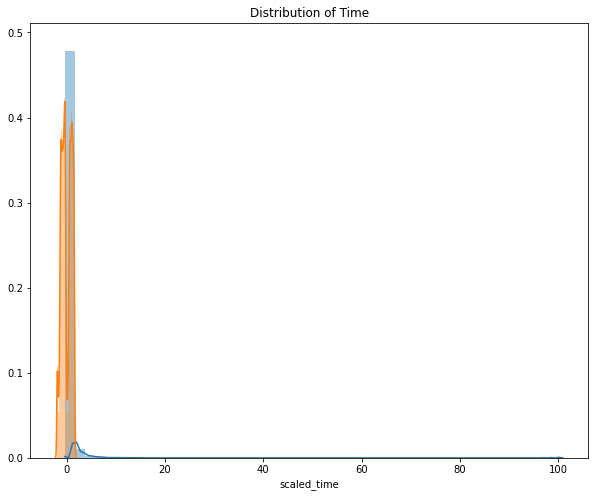

In [13]:
plt.figure(figsize=(10,8))
plt.title('Distribution of Time')
sns.distplot(df1.scaled_amount)
sns.distplot(df1.scaled_time)

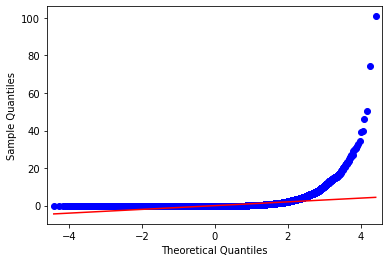

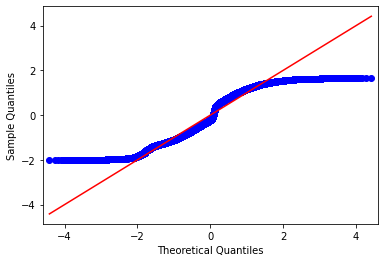

In [62]:
from statsmodels.graphics.gofplots import qqplot

qqplot_data = qqplot(df1['scaled_amount'], line='s').gca().lines
qqplot_data1 = qqplot(df1['scaled_time'], line='s').gca().lines

After scaling, we can immediately see the outliers.

<h2>Plot the dataset<h2>

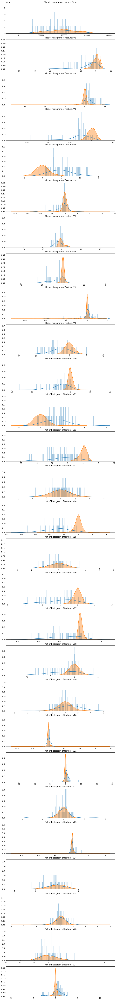

In [28]:
#Let's visualise it before proceeding 
# distribution of anomalous features
features_df = df.iloc[:,0:28].columns
plt.figure(figsize=(12,28*4))
gs_df = gridspec.GridSpec(28, 1)
for i1, c1 in enumerate(df[features_df]):
    ax = plt.subplot(gs_df[i1])
    sns.distplot(df[c1][df.Class == 1], bins=1000)
    sns.distplot(df[c1][df.Class == 0], bins=1000)
    ax.set_xlabel('')
    ax.set_title('Plot of histogram of feature: ' + str(c1))
plt.show()

<h1> Smaller subset of the entire dataframe<h1>

We take a random sample of 25% of the data and visualise it. The major purpose is to notice the changes in the plots and see the effect of the imbalanced data before and after we try and deal with the missing data. Outliers tend to have significantly different mean and standard deviation.

In [18]:
# Print the shape of the data
data = df.sample(frac=0.25, random_state = 48)
print(data.shape)
print(data.describe())

(49841, 31)
                Time            V1            V2            V3            V4  \
count   21312.000000  21312.000000  21312.000000  21312.000000  21312.000000   
mean   189395.608718     -0.021735      0.008337      0.002040      0.008208   
std     66921.053784      2.796876      2.371816      2.152337      1.990826   
min       276.000000    -46.538719    -49.717463    -32.482287     -7.973620   
25%    140244.000000     -1.359286     -0.927197     -1.208314     -1.284739   
50%    191605.500000      0.392620      0.152364      0.164557     -0.092795   
75%    234155.750000      1.667629      1.136173      1.436322      1.146156   
max    344175.000000      4.671880     22.189623      6.088821     17.497442   

                 V5            V6            V7            V8            V9  \
count  21312.000000  21312.000000  21312.000000  21312.000000  21312.000000   
mean      -0.005759     -0.011497      0.001080      0.002600      0.007368   
std        1.979587      1.872

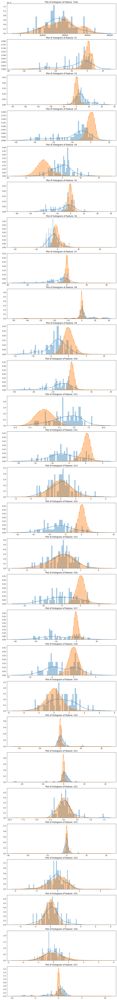

In [19]:
#Let's visualise it before proceeding 
# distribution of anomalous features
features = data.iloc[:,0:28].columns
plt.figure(figsize=(12,28*4))
gs = gridspec.GridSpec(28, 1)
for i, c in enumerate(data[features]):
    ax = plt.subplot(gs[i])
    sns.distplot(data[c][data.Class == 1], bins=50)
    sns.distplot(data[c][data.Class == 0], bins=50)
    ax.set_xlabel('')
    ax.set_title('Plot of histogram of feature: ' + str(c))
plt.show()

In [56]:
df.Class.value_counts()

0    199000
1       364
Name: Class, dtype: int64

In [17]:
#separate the data_fraudulent cases from the authentic ones and compare their occurrences in the dfset
# Determine number of data_fraud cases in dfset
data_fraud = df[df.Class==1]
data_not_fraud = df[df.Class==0]
outlier_fraction = len(data_fraud)/float(len(data_not_fraud))
print(outlier_fraction)
print('Fraud Cases: {}'.format(len(df[df['Class'] == 1])))
print('Non fraud Transactions: {}'.format(len(df[df['Class'] == 0])))

0.001829145728643216
Fraud Cases: 364
Non fraud Transactions: 199000


In [18]:
print('Amount details of fraudulent transaction')
data_fraud.Amount.describe()

Amount details of fraudulent transaction


count     364.000000
mean      127.436731
std       275.470918
min         0.000000
25%         1.000000
50%         9.955000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

In [19]:
print('details of valid transaction')
data_not_fraud.Amount.describe()

details of valid transaction


count    199000.000000
mean         88.690807
std         253.730700
min           0.000000
25%           5.550000
50%          21.990000
75%          76.962500
max       25691.160000
Name: Amount, dtype: float64

<h1>Correlation Analysis<h1>

In [20]:
df.corr().Class.sort_values()

V17      -0.330218
V14      -0.311755
V12      -0.264493
V10      -0.221472
V16      -0.198596
V3       -0.197578
V7       -0.188404
V18      -0.111265
V1       -0.102944
V9       -0.101090
V5       -0.094214
V6       -0.045154
Time     -0.012140
V24      -0.006466
V13      -0.005638
V23      -0.005383
V15      -0.004955
V22       0.001947
V25       0.002626
V26       0.004338
Amount    0.006518
V28       0.009949
V8        0.016385
V27       0.019187
V20       0.023372
V19       0.033686
V21       0.037410
V2        0.094545
V4        0.136486
V11       0.159477
Class     1.000000
Name: Class, dtype: float64

We can observe that V17, V14, V12, V10 are negatively corralated with Class, which means the smaller these values are, the greater probability of fraud.

Correlation matrix graphically gives us an idea of how features correlate with each other and can help us predict what are the features that are most relevant for the prediction.

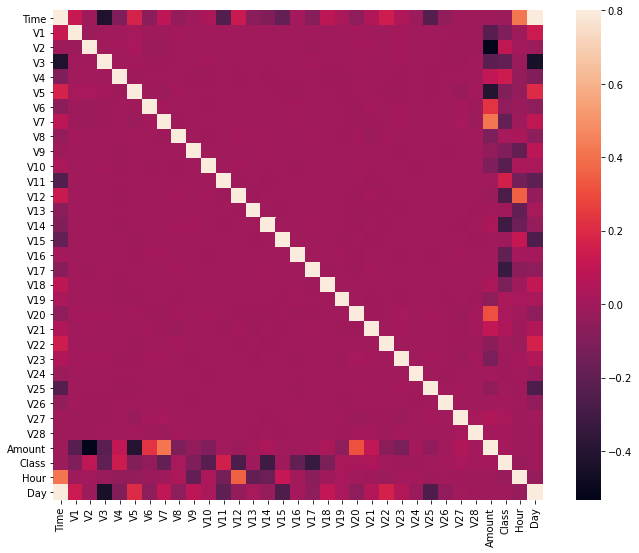

In [42]:
# Correlation matrix
corrmat = df.corr()
fig = plt.figure(figsize = (12, 9))
sns.heatmap(corrmat, vmax = .8, square = True)
plt.show()

<h1>Fraud Data Analysis<h1>

In [14]:
# data_fraud = df[df.Class==1]  #Already mentioned above
# data_not_fraud = df[df.Class==0]

In [21]:
data_fraud.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,...,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.0
mean,81319.782967,-4.700860,3.622201,-7.022850,4.520954,-3.062177,-1.406822,-5.512218,0.455140,-2.601462,...,0.642430,0.031663,-0.080034,-0.091035,0.031813,0.049034,0.181728,0.077010,127.436731,1.0
std,47892.115532,6.747957,4.285820,7.048134,2.889008,5.307719,1.889895,7.286779,6.887602,2.515931,...,3.910979,1.506227,1.734770,0.521515,0.812897,0.471282,1.380049,0.564835,275.470918,0.0
min,406.000000,-30.552380,-8.402154,-31.103685,-1.313275,-22.105532,-6.406267,-43.557242,-41.044261,-13.434066,...,-22.797604,-8.887017,-19.254328,-2.028024,-4.781606,-1.152671,-7.263482,-1.869290,0.000000,1.0
25%,41265.500000,-5.855624,1.245419,-8.356259,2.236188,-4.378676,-2.499278,-7.690527,-0.162366,-3.878941,...,0.036451,-0.542923,-0.351666,-0.427515,-0.327426,-0.263718,-0.020025,-0.115888,1.000000,1.0
50%,75716.000000,-2.307788,2.714209,-5.122335,4.146134,-1.553318,-1.463097,-3.064602,0.558173,-2.192376,...,0.602709,0.048434,-0.063194,-0.031239,0.082519,0.027553,0.391573,0.145335,9.955000,1.0
75%,128647.000000,-0.438377,4.938976,-2.312771,6.356535,0.145295,-0.357560,-1.016682,1.639430,-0.800742,...,1.243244,0.598315,0.311004,0.293483,0.455121,0.396733,0.821464,0.387723,105.890000,1.0
max,169966.000000,2.132386,22.057729,2.041003,12.114672,11.095089,6.474115,5.802537,20.007208,3.353525,...,27.202839,8.361985,5.466230,1.091435,2.208209,2.745261,3.052358,1.779364,2125.870000,1.0


In [26]:
data_fraud['Hour'] = data_fraud['Time'].map(lambda x : x // 3600 % 24)
data_fraud['Day'] = data_fraud['Time'].map(lambda x: x // 3600 // 24 + 1)
data_fraud.head()

<ipython-input-26-3a22cdc49217>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_fraud['Hour'] = data_fraud['Time'].map(lambda x : x // 3600 % 24)
<ipython-input-26-3a22cdc49217>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_fraud['Day'] = data_fraud['Time'].map(lambda x: x // 3600 // 24 + 1)


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V23,V24,V25,V26,V27,V28,Amount,Class,Hour,Day
1081,70828.0,0.196707,1.189757,0.704882,2.891388,0.045555,1.245730,-1.198714,-2.421616,-1.232089,...,-0.005524,-0.814708,0.400924,0.286281,0.135215,0.257315,0.76,1,19.0,1.0
1312,93879.0,-12.833631,7.508790,-20.491952,7.465780,-11.575304,-5.140999,-14.020564,8.332120,-4.337713,...,-0.766495,0.431261,-0.104975,-0.010091,-2.400811,-0.720557,104.03,1,2.0,2.0
1796,152058.0,-3.576362,3.299436,-7.460433,7.783634,-0.398549,-1.968441,-3.110476,-0.328404,-1.574363,...,0.379249,-0.616962,-0.442811,0.359841,-2.651825,0.422184,1.00,1,18.0,2.0
2143,152307.0,-5.222968,4.641827,-8.858204,7.723502,-1.507035,-2.159484,-4.205164,0.979334,-1.505637,...,0.536429,-0.628334,-0.222651,0.382208,-2.693036,0.407935,1.00,1,18.0,2.0
2996,78725.0,-4.312479,1.886476,-2.338634,-0.475243,-1.185444,-2.112079,-2.122793,0.272565,0.290273,...,-1.114692,0.269069,-0.020572,-0.963489,-0.918888,0.001454,60.00,1,21.0,1.0


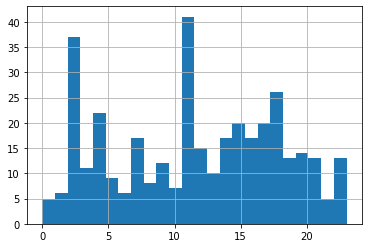

In [27]:
data_fraud.Hour.hist(bins=24)
plt.show()

Fraud data is different from our original dataset and thus shows a different frequency type. It's more likely for the fraudulent transaction to happen during 2am to 3am and 10am to 11am.

In [28]:
data_fraud.Amount.value_counts().head(10)

1.00     83
0.00     23
99.99    20
0.76     12
0.77      6
3.79      4
0.01      4
1.18      3
2.28      3
2.00      3
Name: Amount, dtype: int64

In [29]:
data_fraud.Amount.sort_values(ascending=False).head(10)

180870    2125.87
83193     1809.68
3418      1504.93
35801     1402.16
187105    1389.56
97930     1354.25
143417    1335.00
121139    1218.89
54559      996.27
173323     925.31
Name: Amount, dtype: float64

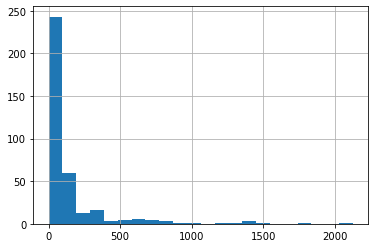

In [30]:
data_fraud.Amount.hist(bins=22)
plt.show()

It seems to be a log normal distribution.

In [31]:
data_fraud.describe() - df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V23,V24,V25,V26,V27,V28,Amount,Class,Hour,Day
count,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,...,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000,-199000.000000
mean,-13486.418097,-4.705049,3.621809,-7.020534,4.520845,-3.058884,-1.410614,-5.512090,0.455997,-2.604357,...,-0.079572,-0.091512,0.032003,0.048918,0.182001,0.076733,38.675181,0.998174,-2.427070,-0.054569
std,380.421683,4.793229,2.647445,5.528439,1.472377,3.919126,0.553801,6.035508,5.697365,1.414093,...,1.102590,-0.083761,0.291717,-0.010971,0.974354,0.234988,21.694187,-0.042691,0.671566,-0.003253
min,406.000000,25.855130,64.313574,17.221905,4.369896,91.637775,19.754239,0.000000,9.644158,0.000000,...,25.553408,0.796825,5.513792,1.451879,15.302197,13.560793,0.000000,1.000000,0.000000,0.000000
25%,-12940.750000,-4.937509,1.844605,-7.464283,3.083677,-3.685618,-1.731560,-7.134452,0.046351,-3.237158,...,-0.189790,-0.073305,-0.009914,0.062738,0.050976,-0.063331,-4.500000,1.000000,-4.000000,0.000000
50%,-8934.000000,-2.331354,2.649958,-5.299315,4.166468,-1.498137,-1.190360,-3.102559,0.535916,-2.143399,...,-0.052423,-0.072505,0.066700,0.079727,0.390361,0.134047,-12.035000,1.000000,-3.000000,0.000000
75%,-10703.250000,-1.755440,4.137857,-3.337773,5.613492,-0.466328,-0.757570,-1.584593,1.312118,-1.401362,...,0.162733,-0.146537,0.104508,0.156006,0.730959,0.309634,28.890000,1.000000,-2.000000,0.000000
max,-2826.000000,-0.322544,0.000000,-7.341556,-4.760672,-23.706577,-66.827511,-114.786957,0.000000,-12.241470,...,-16.617315,-3.493114,-5.311380,-0.772085,-28.559840,-32.068444,-23565.290000,0.000000,0.000000,0.000000


Imbalanced data tends to have erratic mean and standard deviation. The mean of V3 of the fraud data is much smaller than whole data, while the mean of fraud amount is higher. From the values of standard deviation, Fraud data's features are more widely spread especially for amount for features V17, V7, V8 and V3.

In [33]:
(data_fraud.describe() - df.describe()).loc['mean'].sort_values()

Time     -13486.418097
V3           -7.020534
V14          -7.005912
V17          -6.553208
V12          -6.198935
V10          -5.668443
V7           -5.512090
V1           -4.705049
V16          -4.067013
V5           -3.058884
V9           -2.604357
Hour         -2.427070
V18          -2.181220
V6           -1.410614
V13          -0.131247
V15          -0.105948
V24          -0.091512
V23          -0.079572
Day          -0.054569
V25           0.032003
V22           0.033039
V26           0.048918
V28           0.076733
V27           0.182001
V20           0.420970
V8            0.455997
V19           0.639216
V21           0.642457
Class         0.998174
V2            3.621809
V11           3.810842
V4            4.520845
Amount       38.675181
Name: mean, dtype: float64

In [34]:
(data_fraud.describe() - df.describe()).loc['std'].sort_values()

V24        -0.083761
Class      -0.042691
V26        -0.010971
Day        -0.003253
V15         0.139415
V13         0.148470
V28         0.234988
V25         0.291717
V6          0.553801
V20         0.648474
Hour        0.671566
V19         0.719877
V22         0.780656
V27         0.974354
V23         1.102590
V9          1.414093
V4          1.472377
V11         1.633570
V18         2.010725
V2          2.647445
V16         2.885878
V21         3.176496
V14         3.340618
V12         3.554350
V10         3.794812
V5          3.919126
V1          4.793229
V3          5.528439
V8          5.697365
V17         5.951047
V7          6.035508
Amount     21.694187
Time      380.421683
Name: std, dtype: float64

<h1>Fraud vs Non-Fraud data<h1>

In [35]:
#fraud vs. normal transactions 
counts = df.Class.value_counts()
normal = counts[0]
fraudulent = counts[1]
perc_non_fraud = (normal/(normal+fraudulent))*100
perc_fraudulent = (fraudulent/(normal+fraudulent))*100
print('There were {} non-fraudulent transactions ({:.3f}%) vs {} fraudulent transactions ({:.3f}%).'.format(normal, perc_non_fraud, fraudulent, perc_fraudulent))

There were 199000 non-fraudulent transactions (99.817%) vs 364 fraudulent transactions (0.183%).


Text(0.5, 0, 'Class (0:Non-Fraudulent, 1:Fraudulent)')

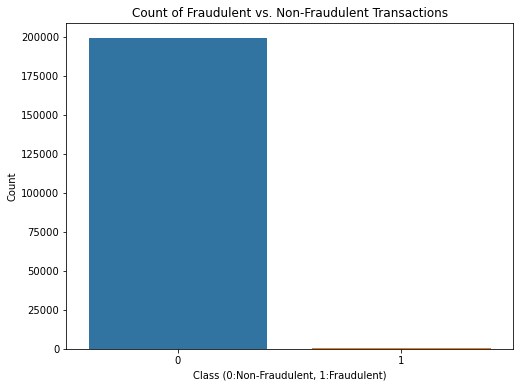

In [36]:
plt.figure(figsize=(8,6))
sns.barplot(x=counts.index, y=counts)
plt.title('Count of Fraudulent vs. Non-Fraudulent Transactions')
plt.ylabel('Count')
plt.xlabel('Class (0:Non-Fraudulent, 1:Fraudulent)')

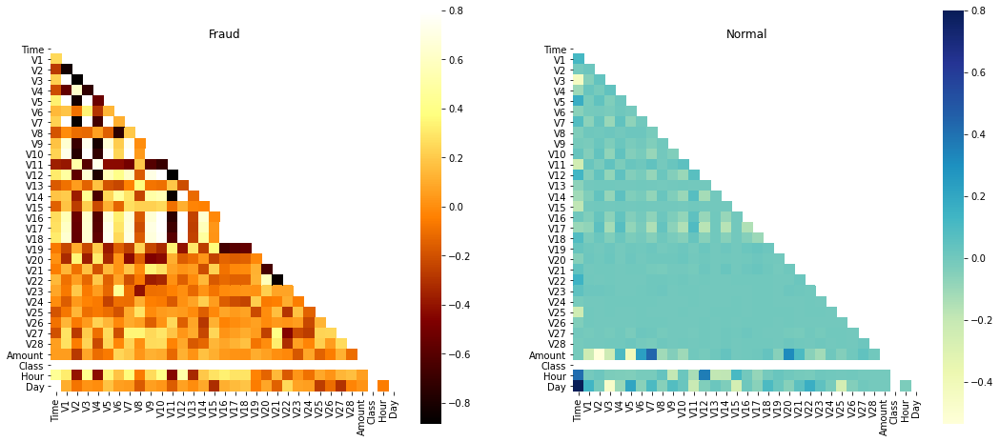

In [37]:
# Correlation matrix 
f, (ax1, ax2) = plt.subplots(1,2,figsize =( 18, 8))
corr = df.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap((df.loc[df['Class'] ==1]).corr(), vmax = .8, square=True, ax = ax1, cmap = 'afmhot', mask=mask);
ax1.set_title('Fraud')
sns.heatmap((df.loc[df['Class'] ==0]).corr(), vmax = .8, square=True, ax = ax2, cmap = 'YlGnBu', mask=mask);
ax2.set_title('Normal')
plt.show()

<h2>Skewness and Kurtosis<h2>

In [38]:
#skewness
skew_measure = df.skew()
skew_measure

Time      -0.036032
V1        -3.272933
V2        -4.357773
V3        -2.308443
V4         0.678861
V5        -3.580076
V6         2.175336
V7         4.068910
V8        -7.810047
V9         0.555179
V10        1.168349
V11        0.365111
V12       -2.275608
V13        0.069048
V14       -2.086913
V15       -0.311162
V16       -1.071618
V17       -3.841096
V18       -0.262804
V19        0.093244
V20       -3.012225
V21        4.063999
V22       -0.225484
V23       -7.013769
V24       -0.551636
V25       -0.412015
V26        0.575222
V27       -0.436719
V28       11.580348
Amount    17.285144
Class     23.339094
Hour      -0.490622
Day        0.034475
dtype: float64

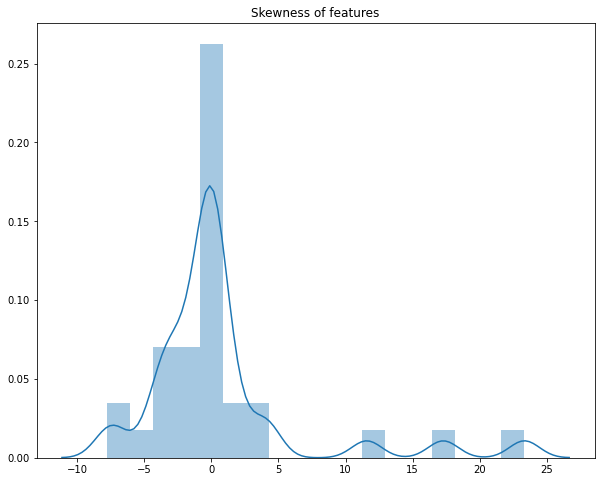

In [39]:
plt.figure(figsize=(10,8))
plt.title('Skewness of features')
sns.distplot(df.skew())

In [40]:
np.mean(df.skew())

0.6877377225204948

In [41]:
#kurtosis
kurtosis_measure = df.kurt()
kurtosis_measure

Time        -1.292933
V1          32.911567
V2          90.633530
V3          28.310765
V4           2.641339
V5         271.171481
V6          55.700462
V7         526.374345
V8         169.519427
V9           3.855632
V10         33.180792
V11          1.699440
V12         19.846919
V13          0.184932
V14         25.120780
V15          0.311564
V16         10.385375
V17         95.458916
V18          2.601458
V19          1.688216
V20        296.610387
V21        191.249452
V22          2.554443
V23        490.929380
V24          0.611886
V25          4.554294
V26          0.934766
V27        308.613348
V28       1082.943858
Amount     887.147197
Class      542.718767
Hour        -0.399060
Day         -1.998832
dtype: float64

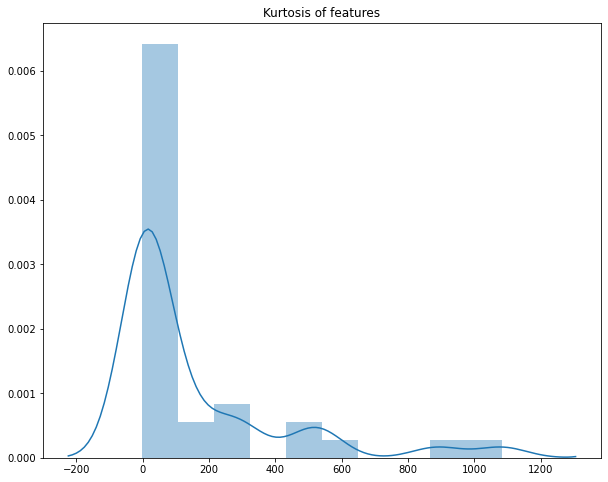

In [42]:
plt.figure(figsize=(10,8))
plt.title('Kurtosis of features')
sns.distplot(df.kurt())

In [43]:
np.mean(df.kurt())

156.87193616855964

<h3>Skewness and Kurtosis of the fraud and non-fraud datasets<h3>

<h4>Fraud data<h4>

Time      0.220689
V1       -1.844146
V2        1.300615
V3       -1.548034
V4        0.493445
V5       -1.356164
V6        0.886698
V7       -2.003063
V8       -2.914916
V9       -1.074744
V10      -1.270296
V11       0.526102
V12      -0.683880
V13      -0.019704
V14      -0.241267
V15      -0.658139
V16      -0.510743
V17      -0.558545
V18      -0.584274
V19       0.020694
V20       2.543940
V21       1.863028
V22      -0.917933
V23      -5.592394
V24      -0.526279
V25      -0.952212
V26       0.547410
V27      -2.357541
V28      -0.604716
Amount    3.774970
Class     0.000000
Hour     -0.096575
Day       0.255845
dtype: float64
Mean skewness of fraud data -0.4206706275557806


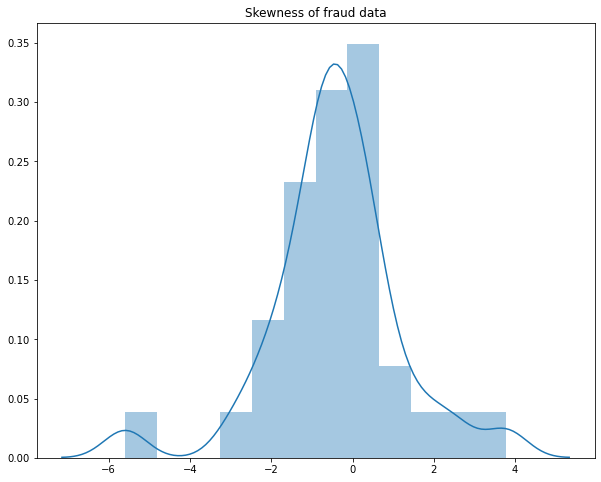

In [48]:
#skewness of fraud data
skew_measure_fraud = data_fraud.skew()
print(skew_measure_fraud)
plt.figure(figsize=(10,8))
plt.title('Skewness of fraud data')
sns.distplot(data_fraud.skew())
print('Mean skewness of fraud data', np.mean(data_fraud.skew()))

Time      -1.204581
V1         3.045121
V2         3.099289
V3         1.875979
V4        -0.235874
V5         1.887035
V6         2.842568
V7         5.239837
V8        16.536096
V9         1.886883
V10        1.924800
V11        0.316140
V12       -0.100495
V13       -0.453635
V14       -0.213547
V15        0.919692
V16       -0.356488
V17       -0.214969
V18       -0.348934
V19       -0.290989
V20       17.749065
V21       29.506119
V22       17.856135
V23       61.047516
V24        0.307986
V25        4.283335
V26        2.339883
V27        8.770676
V28        1.320601
Amount    17.142856
Class      0.000000
Hour      -1.149575
Day       -1.945262
dtype: float64
Mean kurtosis of fraud data 5.860098891579078


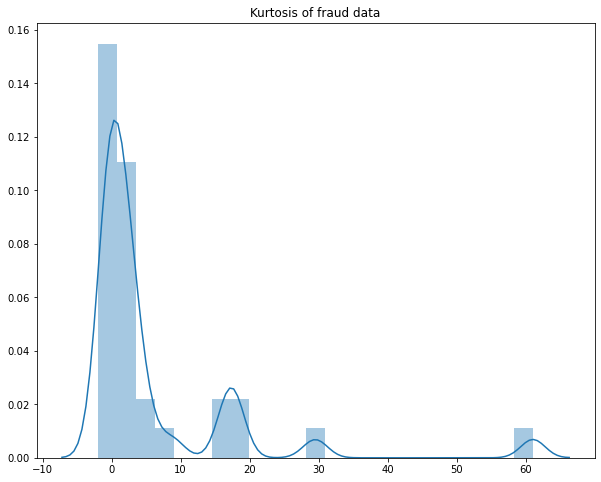

In [49]:
#kurtosis of fraud data
kurt_measure_fraud = data_fraud.kurt()
print(kurt_measure_fraud)
plt.figure(figsize=(10,8))
plt.title('Kurtosis of fraud data')
sns.distplot(data_fraud.kurt())
print('Mean kurtosis of fraud data', np.mean(data_fraud.kurt()))

<h4>Non-Fraud data<h4>

Time      -0.036454
V1        -3.113061
V2        -4.634263
V3        -1.500692
V4         0.578577
V5        -3.437596
V6         2.195413
V7         6.680750
V8        -7.530192
V9         0.676363
V10        2.473150
V11        0.143839
V12       -1.255720
V13        0.069526
V14       -0.715621
V15       -0.309981
V16       -0.415613
V17        0.284096
V18       -0.040824
V19        0.081929
V20       -3.076643
V21        3.710570
V22       -0.213757
V23       -6.936266
V24       -0.551885
V25       -0.408297
V26        0.575313
V27       -0.304251
V28       11.667837
Amount    17.317271
Class      0.000000
dtype: float64
Mean skewness of not_fraud data 0.3862424514308971


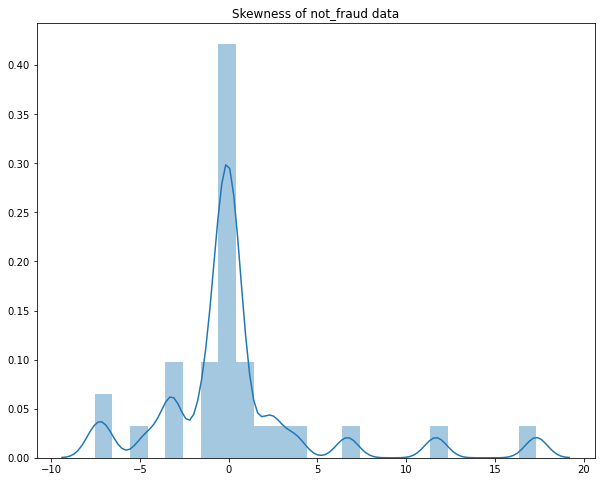

In [50]:
#skewness of non-not_fraud data
skew_measure_not_fraud = data_not_fraud.skew()
print(skew_measure_not_fraud)
plt.figure(figsize=(10,8))
plt.title('Skewness of not_fraud data')
sns.distplot(data_not_fraud.skew())
print('Mean skewness of not_fraud data', np.mean(data_not_fraud.skew()))

Time        -1.292963
V1          31.409145
V2          93.168669
V3          16.124169
V4           2.072402
V5         287.042099
V6          56.197851
V7         599.193060
V8         149.601393
V9           3.243470
V10         22.254659
V11          0.020687
V12          5.113952
V13          0.186261
V14          7.910939
V15          0.308445
V16          3.059231
V17         19.252396
V18          0.839014
V19          1.663336
V20        299.604945
V21        158.856252
V22          1.930686
V23        497.079991
V24          0.612122
V25          4.531176
V26          0.932591
V27        319.159935
V28       1092.803520
Amount     889.386170
Class        0.000000
dtype: float64
Mean kurtosis of not_fraud data 147.1698581099108


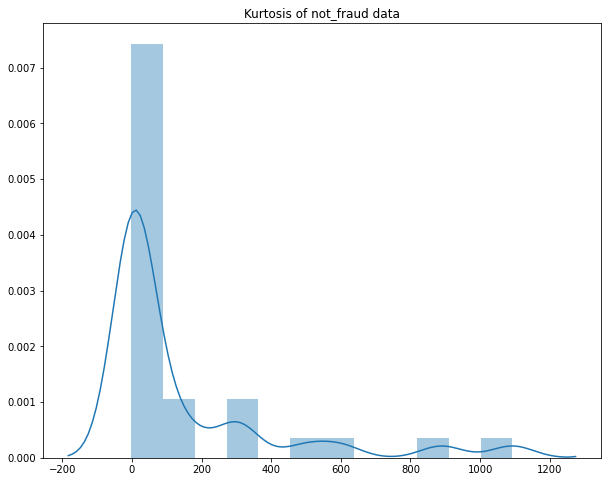

In [51]:
#kurtosis of not_fraud data
kurt_measure_not_fraud = data_not_fraud.kurt()
print(kurt_measure_not_fraud)
plt.figure(figsize=(10,8))
plt.title('Kurtosis of not_fraud data')
sns.distplot(data_not_fraud.kurt())
print('Mean kurtosis of not_fraud data', np.mean(data_not_fraud.kurt()))

<h1>Essential Plots<h1>

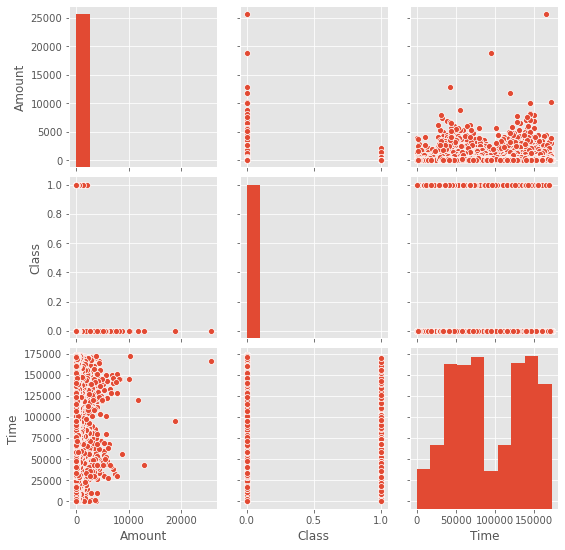

In [75]:
sns.pairplot(data = df[['Amount', 'Class', 'Time']])

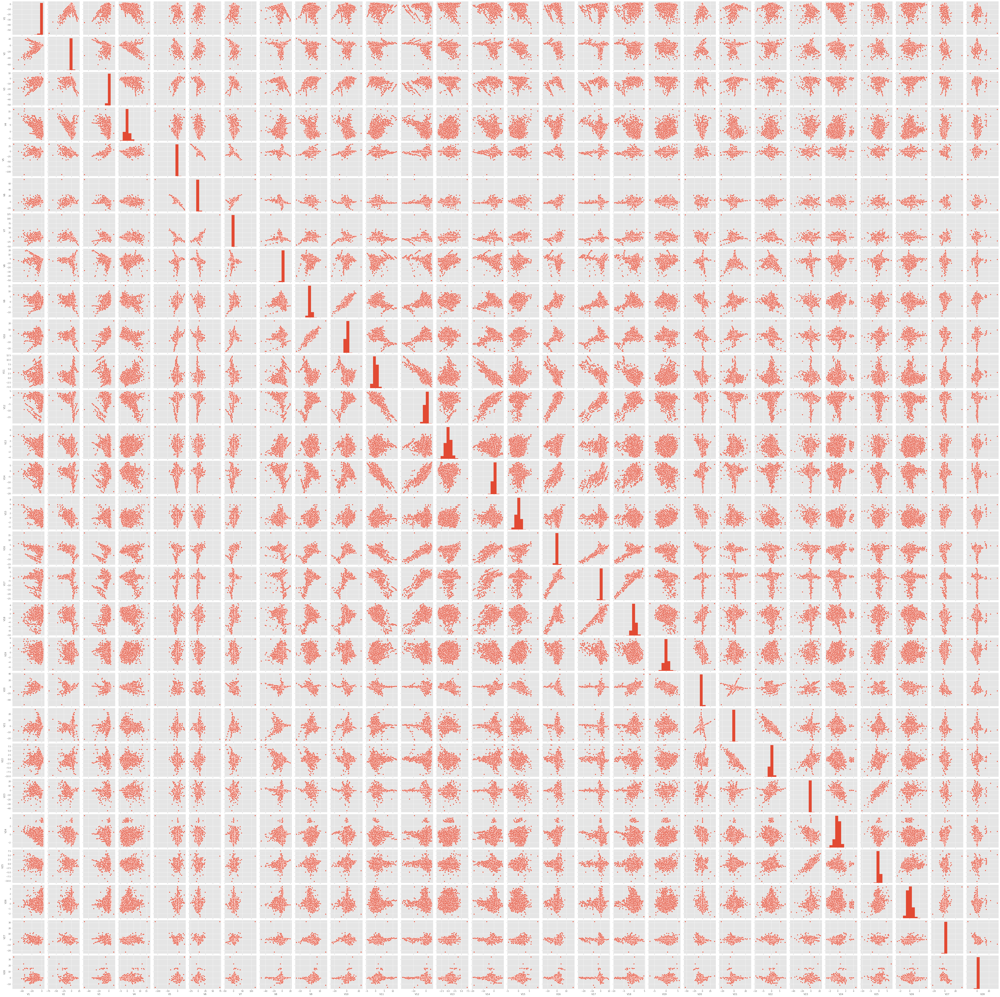

In [76]:
sns.pairplot(data = df.drop(columns=['Amount', 'Class', 'Time']))

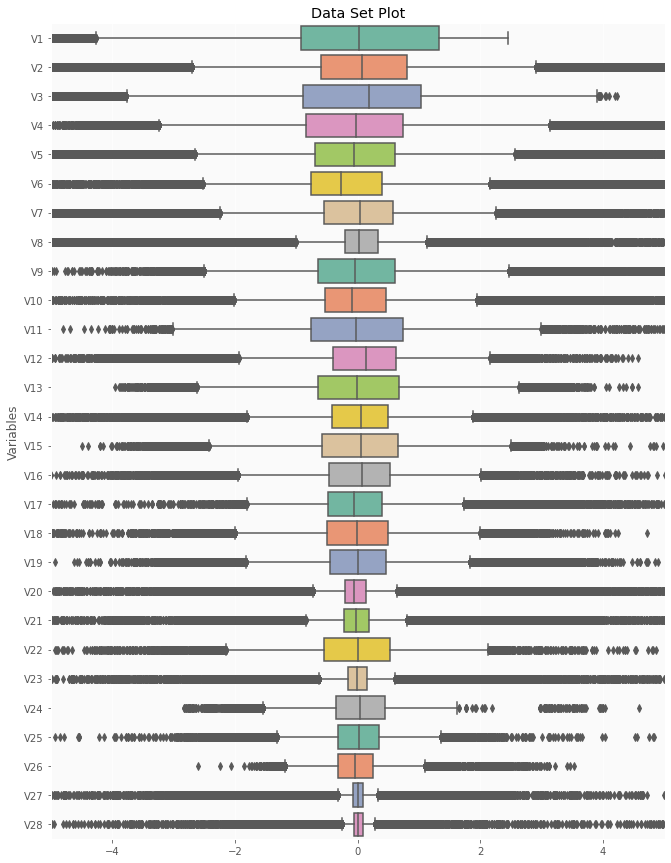

In [71]:
plt.style.use('ggplot') # Using ggplot2 style visuals 

f, ax = plt.subplots(figsize=(11, 15))

ax.set_facecolor('#fafafa')
ax.set(xlim=(-5, 5))
plt.ylabel('Variables')
plt.title("Data Set Plot")
ax = sns.boxplot(data = df.drop(columns=['Amount', 'Class', 'Time']), 
  orient = 'h', 
  palette = 'Set2')

In [4]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from statsmodels.graphics.gofplots import qqplot

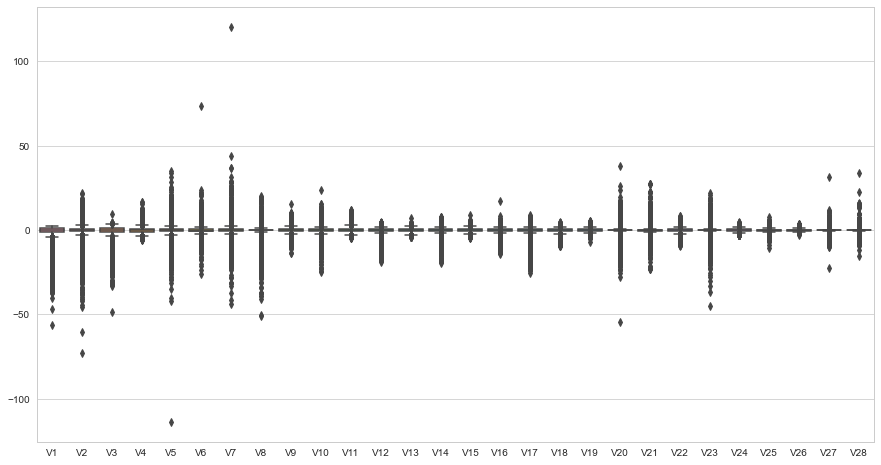

In [81]:
plt.figure(figsize=(15,8))
sns.set_style("whitegrid")
sns.boxplot(data = df.drop(columns=['Amount', 'Class', 'Time'])) 

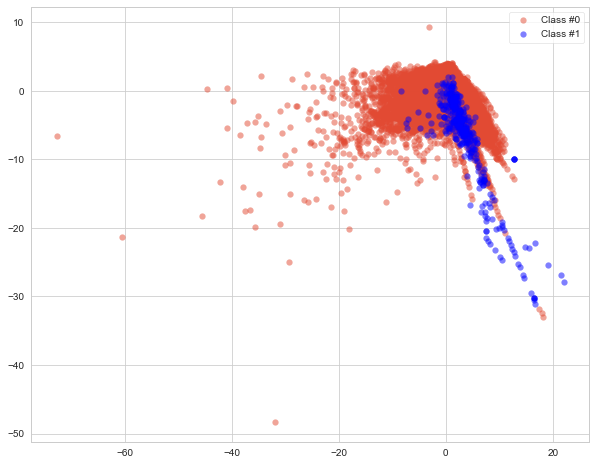

In [85]:
def prep_data(df: pd.DataFrame) -> (np.ndarray, np.ndarray):
    """
    Convert the DataFrame into two variable
    X: data columns (V1 - V28)
    y: lable column
    """
    X = df.iloc[:, 2:30].values
    y = df.Class.values
    return X, y

# Define a function to create a scatter plot of our data and labels
def plot_data(X: np.ndarray, y: np.ndarray):
    plt.scatter(X[y == 0, 0], X[y == 0, 1], label="Class #0", alpha=0.5, linewidth=0.15)
    plt.scatter(X[y == 1, 0], X[y == 1, 1], label="Class #1", alpha=0.5, linewidth=0.15, c='b')
    plt.legend()
    return plt.show()
X, y = prep_data(df)
plt.figure(figsize=(10,8))
plot_data(X, y)

We can immediately see how our fraud cases are scattered over our data.

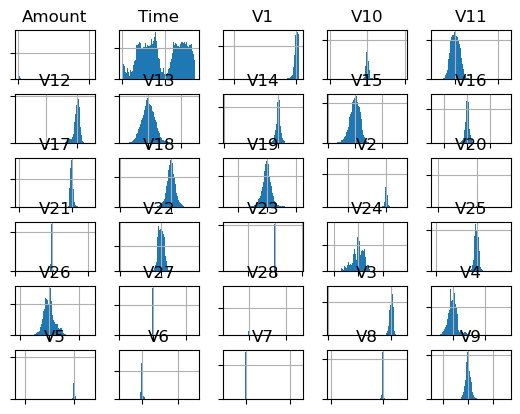

<Figure size 2000x2000 with 0 Axes>

In [22]:
# create histograms of input variables
from pandas import read_csv
import matplotlib.pyplot as plt
# drop the target variable
df2 = df.drop('Class', axis=1)

# create a histogram plot of each numeric variable
ax = df2.hist(bins=100)

# disable axis labels to avoid the clutter
for axis in ax.flatten():
    axis.set_xticklabels([])
    axis.set_yticklabels([])
    
plt.figure(figsize=(20,20))
plt.show()